# Trabajo Práctico Final - Aprendizaje de Máquina I (AmMaqI) CEIA

#### Autores:
- Rivollier, Gaspar

## Introducción

El presente trabajo práctico tiene como objetivo desarrollar un modelo predictivo capaz de estimar el riesgo relativo de ocurrencia de delitos en función de variables espaciales y temporales. Para ello, se basa en el [dataset de delitos del gobierno de la Ciudad de Buenos Aires](https://data.buenosaires.gob.ar/dataset/delitos), sobre el cual se aplicaron técnicas de modelado supervisado utilizando XGBoost como algoritmo principal.

El enfoque busca capturar patrones espacio-temporales en la distribución delictiva, evaluando el impacto de variables como el día de la semana, el mes y la franja horaria sobre la probabilidad de ocurrencia. Una vez entrenado el modelo, se generaron mapas de calor por hora del día y día, permitiendo visualizar la dinámica geográfica del riesgo en distintos momentos.

El desempeño del modelo fue evaluado mediante métricas como RMSE, MAE y R², alcanzando un nivel de precisión satisfactorio y demostrando la capacidad del enfoque para asistir en tareas de análisis predictivo y toma de decisiones basadas en datos.

Adicionalmente, se pueden ver los resultados del modelo en un widget al final del trabajo que está enriquecido con el [dataset de geolocalización](https://data.buenosaires.gob.ar/ca/dataset/barrios/resource/1c3d185b-fdc9-474b-b41b-9bd960a3806e) de los barrios de la Ciudad de Buenos Aires, facilitado por la misma.  

### Descripción del dataset

El dataset contiene información georreferenciada sobre los **hechos delictivos registrados en la Ciudad Autónoma de Buenos Aires (CABA)**, recopilados por el **Ministerio de Justicia y Seguridad del Gobierno de la Ciudad** y publicados en el portal oficial [Buenos Aires Data](https://data.buenosaires.gob.ar/).

---

##### 🧱 Estructura general

- **Formato:** CSV (valores separados por coma)
- **Período cubierto:** 2016 en adelante
- **Frecuencia de actualización:** anual
- **Cantidad de columnas:** 15
- **Unidad de análisis:** cada fila representa un hecho delictivo individual, geolocalizado y clasificado según su tipo penal

---

##### 🧩 Principales variables

| Columna | Tipo | Descripción |
|----------|------|-------------|
| `id-mapa` | int64 | Identificador único del hecho |
| `anio` | int64 | Año del suceso |
| `mes` | string | Mes del hecho (texto, ej. “ENERO”) |
| `dia` | string | Día de la semana del hecho |
| `fecha` | date | Fecha exacta del hecho (YYYY-MM-DD) |
| `franja` | float | Franja horaria o hora estimada (0–24) |
| `tipo` | string | Tipo general de delito (Robo, Hurto, Lesiones, etc.) |
| `subtipo` | string | Subcategoría del tipo de delito |
| `uso_arma` | string | Indica si hubo utilización de arma de fuego o arma blanca |
| `uso_moto` | string | Indica si el hecho involucró el uso de motocicleta |
| `barrio` | string | Barrio de la Ciudad donde ocurrió el hecho |
| `comuna` | int64 | Comuna correspondiente |
| `latitud` | float | Coordenada geográfica de latitud |
| `longitud` | float | Coordenada geográfica de longitud |
| `cantidad` | int | Cantidad de hechos (normalmente 1) |

## Configuraciones e Imports

In [ ]:
# ======================================
# Configuración general e imports
# ======================================

# --- Utilidades del sistema y tiempo ---
import os
import json
import math
from datetime import datetime
from dateutil.relativedelta import relativedelta
import joblib

# --- Ciencia de datos y estadística ---
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import randint, uniform

# --- Modelado y evaluación ---
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    TimeSeriesSplit
)
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    FunctionTransformer,
    LabelEncoder
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)
from sklearn.inspection import permutation_importance

# --- Modelos avanzados (XGBoost) ---
import xgboost as xgb
from xgboost import XGBRegressor, DMatrix, train, plot_importance

# --- Visualización geográfica e interactiva ---
import geopandas as gpd
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display

# ---- Parámetros globales ----
RANDOM_STATE = 22


## Data import

In [ ]:
# Bloque de deteccion de colab/local para montar drive y definir path
# Detect environment (Colab vs local)
try:
    import google.colab  # Try to import Colab module
    IN_COLAB = True
except ImportError:
    IN_COLAB = False


# Mount drive if in Colab
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    DATA_DIR = "/content/drive/MyDrive/CEIA/25-B4 ApMq/TP/Dataset"
    MODEL_PATH = "model_xgb_gpu.json"
    EVALS_PATH = "evals_result.pkl"

    # Configuración para que funcione ipywidgets en Colab
    !pip install ipywidgets==7.7.1 > /dev/null
    from google.colab import output
    output.enable_custom_widget_manager()
else:
    # Local path (adjust if needed)
    DATA_DIR = os.path.join(os.getcwd(), "dataset")
    MODEL_PATH = os.path.join(os.getcwd(), "model", "model_xgb_gpu.json")
    EVALS_PATH = os.path.join(os.getcwd(), "model", "evals_result.pkl")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [67]:
# Detecta automáticamente todos los archivos .csv dentro de la carpeta
csv_files = [os.path.join(DATA_DIR, f) for f in os.listdir(DATA_DIR) if f.endswith(".csv")]
print(f"Se encontraron {len(csv_files)} archivos CSV.")

# Carga y concatena todos los CSV
df_list = []
for path in csv_files:
    try:
        df = pd.read_csv(path)
        df_list.append(df)
        print(f"✔️  {os.path.basename(path)} ({len(df)} filas)")
    except Exception as e:
        print(f"⚠️ Error con {os.path.basename(path)}: {e}")

df = pd.concat(df_list, ignore_index=True)
print("\nTotal filas combinadas:", len(df))

df.head()


Se encontraron 9 archivos CSV.
✔️  delitos_2018.csv (149455 filas)
✔️  delitos_2019.csv (149524 filas)
✔️  delitos_2020.csv (86175 filas)
✔️  delitos_2021.csv (111962 filas)
✔️  delitos_2022.csv (140918 filas)
✔️  delitos_2023.csv (155897 filas)
✔️  delitos_2024.csv (158838 filas)
✔️  delitos_2017.csv (146938 filas)
✔️  delitos_2016.csv (154712 filas)

Total filas combinadas: 1254419


,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,comuna,latitud,longitud,cantidad
0,500003,2018,AGOSTO,DOMINGO,2018-08-05,16.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1
1,500006,2018,AGOSTO,LUNES,2018-08-06,17.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1
2,500009,2018,AGOSTO,MIERCOLES,2018-08-08,22.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1
3,500012,2018,AGOSTO,MIERCOLES,2018-08-08,15.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.595628,-58.386597,1
4,500015,2018,AGOSTO,VIERNES,2018-08-10,12.0,Robo,Robo total,SI,NO,RETIRO,1.0,-34.581095,-58.385790,1


## Exploratory Data Analysis

In [68]:
# Ajuste del dataset
# Aseguramos que la columna 'fecha' sea datetime
df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')

# Conteo de delitos por día
df['_date'] = df['fecha'].dt.date
counts_by_day = df.groupby('_date').size()

In [69]:

# Estructura general
print("Dimensiones del dataset:", df.shape)
print("\nTipos de datos:")
print(df.dtypes)

# Nulos y valores únicos
print("\nCantidad de valores nulos por columna:")
print(df.isna().sum().sort_values(ascending=False))

Dimensiones del dataset: (1254419, 16)

Tipos de datos:
id-mapa              int64
anio                 int64
mes                 object
dia                 object
fecha       datetime64[ns]
franja             float64
tipo                object
subtipo             object
uso_arma            object
uso_moto            object
barrio              object
comuna             float64
latitud            float64
longitud           float64
cantidad             int64
_date               object
dtype: object

Cantidad de valores nulos por columna:
comuna      31983
barrio      31981
latitud     27721
longitud    27721
franja       2375
id-mapa         0
mes             0
anio            0
subtipo         0
tipo            0
fecha           0
dia             0
uso_arma        0
uso_moto        0
cantidad        0
_date           0
dtype: int64


In [70]:
print("\nCantidad de valores únicos por columna:")
print(df.nunique().sort_values(ascending=False))

# Porcentaje de nulos
null_percent = df.isna().mean().sort_values(ascending=False) * 100
print("\nPorcentaje de nulos (%):")
print(null_percent)


Cantidad de valores únicos por columna:
id-mapa     1254419
longitud     315976
latitud      295783
fecha          3288
_date          3288
barrio           48
franja           24
comuna           15
mes              12
subtipo          10
anio              9
dia               7
tipo              6
uso_moto          2
uso_arma          2
cantidad          1
dtype: int64

Porcentaje de nulos (%):
comuna      2.549627
barrio      2.549467
latitud     2.209868
longitud    2.209868
franja      0.189331
id-mapa     0.000000
mes         0.000000
anio        0.000000
subtipo     0.000000
tipo        0.000000
fecha       0.000000
dia         0.000000
uso_arma    0.000000
uso_moto    0.000000
cantidad    0.000000
_date       0.000000
dtype: float64


In [71]:
# Vemos poco impacto porcentual en el dataset. Continuamos con la remoción de los nulos
print("shape df original:", df.shape)
print("shape sin NaNs:", df.dropna().shape)

df.dropna(inplace=True)

shape df original: (1254419, 16)
shape sin NaNs: (1220378, 16)


In [72]:
df.head(5)

,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,comuna,latitud,longitud,cantidad,_date
0,500003,2018,AGOSTO,DOMINGO,2018-08-05,16.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1,2018-08-05
1,500006,2018,AGOSTO,LUNES,2018-08-06,17.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1,2018-08-06
2,500009,2018,AGOSTO,MIERCOLES,2018-08-08,22.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.580776,-58.387188,1,2018-08-08
3,500012,2018,AGOSTO,MIERCOLES,2018-08-08,15.0,Robo,Robo total,NO,NO,RETIRO,1.0,-34.595628,-58.386597,1,2018-08-08
4,500015,2018,AGOSTO,VIERNES,2018-08-10,12.0,Robo,Robo total,SI,NO,RETIRO,1.0,-34.581095,-58.385790,1,2018-08-10


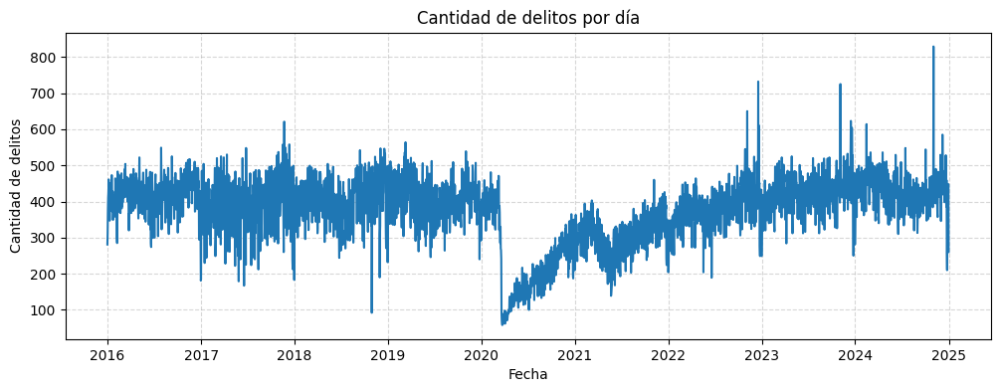

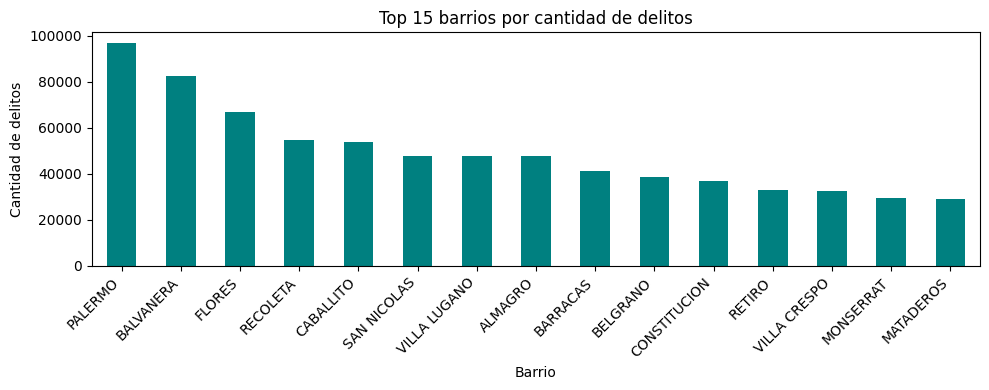

Se detectó columna de tipo de delito: tipo


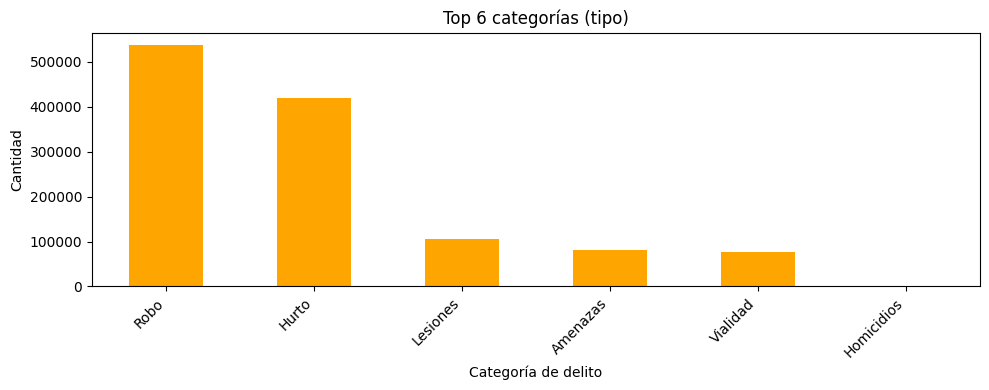

In [73]:

plt.figure(figsize=(12, 4))
counts_by_day.plot()
plt.title("Cantidad de delitos por día")
plt.xlabel("Fecha")
plt.ylabel("Cantidad de delitos")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


# Top barrios
# Verificamos que exista una columna válida
if 'barrio' in df.columns:
    geo_col = 'barrio'
elif 'comuna' in df.columns:
    geo_col = 'comuna'
else:
    raise ValueError("No se encontró columna geográfica válida ('barrio' o 'comuna').")

top_geo = df[geo_col].value_counts().head(15)

plt.figure(figsize=(10, 4))
top_geo.plot(kind='bar', color='teal')
plt.title(f"Top {len(top_geo)} {geo_col}s por cantidad de delitos")
plt.xlabel(geo_col.capitalize())
plt.ylabel("Cantidad de delitos")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Tipo de delito
guess_type_cols = [c for c in df.columns if 'delito' in c or 'hecho' in c or 'tipo' in c]

if guess_type_cols:
    tipo_col = guess_type_cols[0]
    print(f"Se detectó columna de tipo de delito: {tipo_col}")
    top_tipo = df[tipo_col].value_counts().head(15)
    plt.figure(figsize=(10, 4))
    top_tipo.plot(kind='bar', color='orange')
    plt.title(f"Top {len(top_tipo)} categorías ({tipo_col})")
    plt.xlabel("Categoría de delito")
    plt.ylabel("Cantidad")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

Las estadísticas de 2020 están muy por debajo del promedio. Muy posiblemente por la pandemia COVID-19. Se decide retirar del análisis todo 2020 y 2021 porque se quiere analizar la posibilidad de delitos en condiciones normales. En este análisis tomamos períodos normales hasta 2020 y desde 2022.

In [74]:
# Filtramos años 2020 y 2021
df['anio'] = df['anio'].astype(int)
df = df[~df['anio'].isin([2020, 2021])]
# Recalcular los conteos por fecha usando el DataFrame filtrado
counts_by_day = df.groupby('fecha').size()


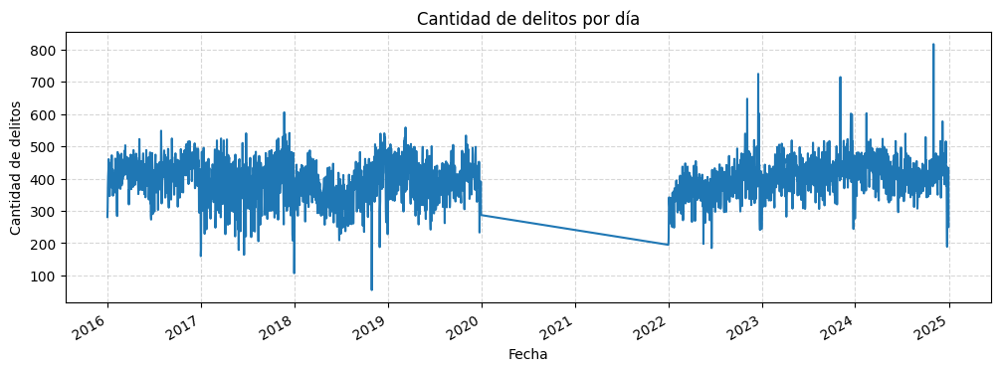

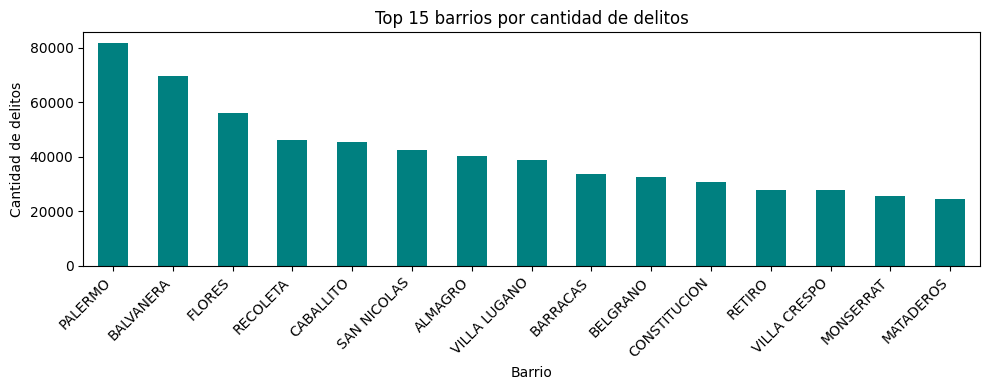

Se detectó columna de tipo de delito: tipo


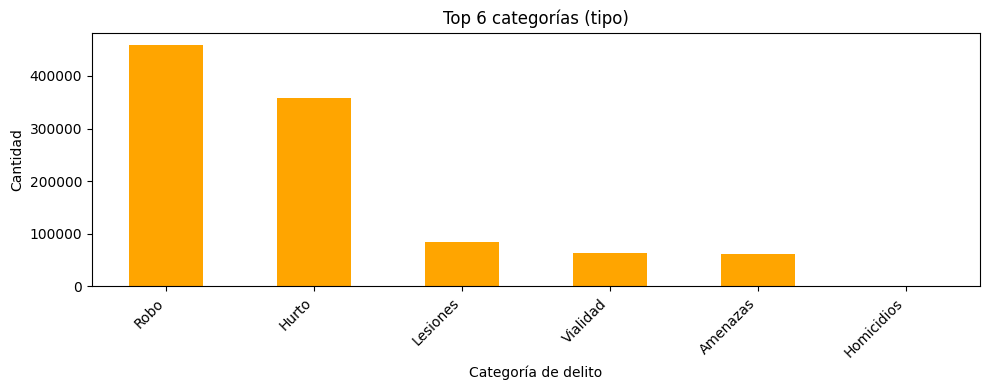

In [75]:
# --- Gráfico de delitos por día ---
plt.figure(figsize=(12, 4))
counts_by_day.plot()
plt.title("Cantidad de delitos por día")
plt.xlabel("Fecha")
plt.ylabel("Cantidad de delitos")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- Top barrios o comunas ---
if 'barrio' in df.columns:
    geo_col = 'barrio'
elif 'comuna' in df.columns:
    geo_col = 'comuna'
else:
    raise ValueError("No se encontró columna geográfica válida ('barrio' o 'comuna').")

top_geo = df[geo_col].value_counts().head(15)

plt.figure(figsize=(10, 4))
top_geo.plot(kind='bar', color='teal')
plt.title(f"Top {len(top_geo)} {geo_col}s por cantidad de delitos")
plt.xlabel(geo_col.capitalize())
plt.ylabel("Cantidad de delitos")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# --- Tipo de delito ---
guess_type_cols = [c for c in df.columns if 'delito' in c or 'hecho' in c or 'tipo' in c]

if guess_type_cols:
    tipo_col = guess_type_cols[0]
    print(f"Se detectó columna de tipo de delito: {tipo_col}")
    top_tipo = df[tipo_col].value_counts().head(15)
    plt.figure(figsize=(10, 4))
    top_tipo.plot(kind='bar', color='orange')
    plt.title(f"Top {len(top_tipo)} categorías ({tipo_col})")
    plt.xlabel("Categoría de delito")
    plt.ylabel("Cantidad")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


## Pre-processing

In [76]:
# Dropeamos id-mapa, _date, comuna (vamos a usar barrio), año (solo usamos dia, mes y numero de dia)
df.drop(columns=['id-mapa', '_date', 'comuna', 'anio'], inplace=True, errors='ignore')
df.head(5)

,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,latitud,longitud,cantidad
0,AGOSTO,DOMINGO,2018-08-05,16.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1
1,AGOSTO,LUNES,2018-08-06,17.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1
2,AGOSTO,MIERCOLES,2018-08-08,22.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1
3,AGOSTO,MIERCOLES,2018-08-08,15.0,Robo,Robo total,NO,NO,RETIRO,-34.595628,-58.386597,1
4,AGOSTO,VIERNES,2018-08-10,12.0,Robo,Robo total,SI,NO,RETIRO,-34.581095,-58.385790,1


In [77]:
# Convertir fecha a día del mes,
df['dia_num'] = df['fecha'].dt.day
df.drop(columns=['fecha'], errors='ignore', inplace=True)
df.head(5)

,mes,dia,franja,tipo,subtipo,uso_arma,uso_moto,barrio,latitud,longitud,cantidad,dia_num
0,AGOSTO,DOMINGO,16.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1,5
1,AGOSTO,LUNES,17.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1,6
2,AGOSTO,MIERCOLES,22.0,Robo,Robo total,NO,NO,RETIRO,-34.580776,-58.387188,1,8
3,AGOSTO,MIERCOLES,15.0,Robo,Robo total,NO,NO,RETIRO,-34.595628,-58.386597,1,8
4,AGOSTO,VIERNES,12.0,Robo,Robo total,SI,NO,RETIRO,-34.581095,-58.385790,1,10


In [78]:
# storeamos mapping de barrios para uso posterior
barrio_mapping = dict(enumerate(df['barrio'].astype('category').cat.categories))
dia_mapping = dict(enumerate(df['dia'].astype('category').cat.categories))

# Encode simple para variables categóricas

for col in ['dia', 'mes', 'uso_arma', 'uso_moto', 'tipo', 'barrio']:
    df[col] = df[col].astype('category').cat.codes

df.drop(columns=['subtipo'], inplace=True, errors='ignore')



Las variables mas correlacionadas parecen ser tipo con uso_arma, y uso_moto con tipo (0.23 y 0.18 respectivamente). Proseguimos con las variables seleccionadas.

Para poder generar predicciones, debo generar bins de longitud, latitud y agruparlos por dia, dia_num, mes, franja. Para que luego se pueda trabajar la regresion.

In [79]:
df_grouped = (
    df.groupby(['dia', 'franja', 'barrio'])
      .agg({'cantidad':'sum'})
      .reset_index()
)

df_grouped.sort_values('cantidad', ascending=False).head(5)


,dia,franja,barrio,cantidad
7892,6,20.0,20,828
5588,4,20.0,20,812
7778,6,18.0,2,801
7844,6,19.0,20,795
2084,1,19.0,20,788


In [80]:
df_grouped.shape

(8064, 4)

## Entrenamiento preliminar de modelos y comparación

Para elegir los modelos que se compararan se utilizaron los siguientes criterios:
- **Regresión lineal**: Se utiliza como baseline para comparar los modelos.
- **Random Forest**: Debido a que el algoritmo tiene buena capacidad de ajustarse a datos no lineales. Es robusto ante el ruido y valores atípicos. Además sirve para ofrecer medidas de importancia de variables, facilitando la interpretación de los factores que más influyen en el riesgo delictivo. De este modo, Random Forest no solo busca mejorar el desempeño predictivo respecto al modelo lineal, sino también ofrecer información interpretativa sobre los patrones detectados.
- **XGBoost**: Debido al tamaño del dataset consideramos la posibilidad de XGBoost para acelaración vía GPU del tiempo de entrenamiento.

### Splitting dataset

In [81]:

X = df_grouped.loc[:, df_grouped.columns != 'cantidad']
y = df_grouped['cantidad']

# 4️⃣ Train-test split + escalado
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("X train: ", X_train.shape)
print("X test: ", X_test.shape)
print("y train", y_train.shape)
print("y test", y_test.shape)


X train:  (6451, 3)
X test:  (1613, 3)
y train (6451,)
y test (1613,)


### Modelo baseline (regresión)

RMSE: 112.019
MAE:  77.917
R²:   0.148


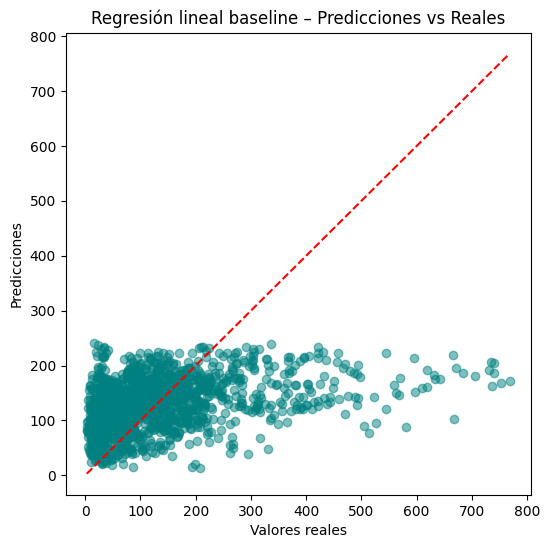

In [82]:
# Seteo de modelo
model = LinearRegression()
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

# Evaluación
rmse = root_mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.3f}")
print(f"MAE:  {mae:.3f}")
print(f"R²:   {r2:.3f}")

# Visualización
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.5, color='teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Valores reales")
plt.ylabel("Predicciones")
plt.title("Regresión lineal baseline – Predicciones vs Reales")
plt.show()

### Random Forest

Random Forest -> RMSE: 19.830
                  MAE:  13.453
                  R²:   0.973


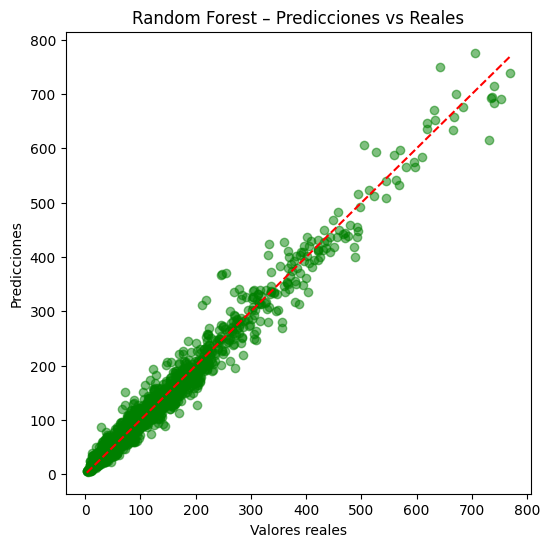

In [92]:
# Modelo
rf_model = RandomForestRegressor(
    n_estimators=150,
    max_depth=15,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
# Entrenamiento
rf_model.fit(X_train, y_train)
# Predicciones
y_pred_rf = rf_model.predict(X_test)

# Evaluación
rmse_rf = root_mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest -> RMSE: {rmse_rf:.3f}")
print(f"                  MAE:  {mae_rf:.3f}")
print(f"                  R²:   {r2_rf:.3f}")

# Visualización
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred_rf, alpha=0.5, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Valores reales")
plt.ylabel("Predicciones")
plt.title("Random Forest – Predicciones vs Reales")
plt.show()


### Modelo XGBoost

XGBoost -> RMSE: 29.682
            MAE:  18.071
            R²:   0.940


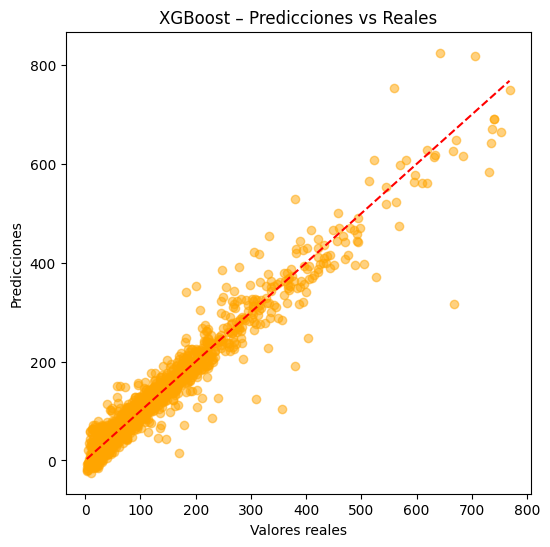

In [84]:
# Modelo
xgb_model = XGBRegressor(
    n_estimators=150,
    learning_rate=0.1,
    max_depth=15,
    subsample=0.8,
    colsample_bytree=0.8,
    device = "cuda",   # usa GPU si está disponible
    random_state=RANDOM_STATE ,
    n_jobs=-1
)
# Entrenamiento
xgb_model.fit(X_train, y_train)

# Predicciones
y_pred_xgb = xgb_model.predict(X_test)


# Evaluación
rmse_xgb = root_mean_squared_error(y_test, y_pred_xgb)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost -> RMSE: {rmse_xgb:.3f}")
print(f"            MAE:  {mae_xgb:.3f}")
print(f"            R²:   {r2_xgb:.3f}")

# Visualización
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred_xgb, alpha=0.5, color='orange')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Valores reales")
plt.ylabel("Predicciones")
plt.title("XGBoost – Predicciones vs Reales")
plt.show()


## Comparación preliminar de modelos


,Modelo,RMSE,MAE,R²
0,Random Forest,19.943433,13.481900,0.972978
1,XGBoost,29.681658,18.071245,0.940147
2,Regresión Lineal,112.018578,77.916996,0.147506


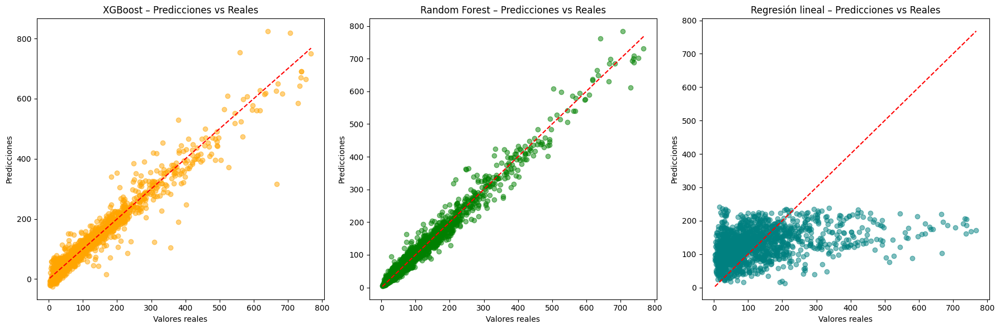

In [ ]:
#  Tabla comparativa de métricas
results = pd.DataFrame({
    'Modelo': ['XGBoost', 'Random Forest', 'Regresión Lineal'],
    'RMSE': [rmse_xgb, rmse_rf, rmse],
    'MAE': [mae_xgb, mae_rf, mae],
    'R²': [r2_xgb, r2_rf, r2]
})

# Mostrar tabla ordenada por R² descendente
results = results.sort_values(by='R²', ascending=False).reset_index(drop=True)
display(results)

# --- Visualización comparativa de predicciones ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# XGBoost
axes[0].scatter(y_test, y_pred_xgb, alpha=0.5, color='orange')
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[0].set_title("XGBoost – Predicciones vs Reales")
axes[0].set_xlabel("Valores reales")
axes[0].set_ylabel("Predicciones")

# Random Forest
axes[1].scatter(y_test, y_pred_rf, alpha=0.5, color='green')
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[1].set_title("Random Forest – Predicciones vs Reales")
axes[1].set_xlabel("Valores reales")
axes[1].set_ylabel("Predicciones")

# Regresión lineal
axes[2].scatter(y_test, y_pred, alpha=0.5, color='teal')
axes[2].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[2].set_title("Regresión lineal – Predicciones vs Reales")
axes[2].set_xlabel("Valores reales")
axes[2].set_ylabel("Predicciones")

plt.tight_layout()
plt.show()


La tabla y gráficos permiten evaluar el desempeño de los tres modelos considerados: Regresión Lineal, Random Forest y XGBoost.

- Como baseline: Regresión Lineal muestra un R² muy bajo (0.15) y errores significativamente más altos. Esto indica que no logra modelar las relaciones no lineales entre las variables espaciales y temporales del dataset de delitos, siendo adecuada únicamente como referencia comparativa.

- Random Forest obtuvo el mejor desempeño global, con un R² de 0.97, lo que indica que explica el 97% de la variabilidad en los valores reales de delitos estimados. Además, presenta los menores errores (RMSE y MAE), mostrando una excelente capacidad predictiva.

- XGBoost, si bien presenta una leve pérdida de precisión respecto al Random Forest, mantiene un buen ajuste general y una capacidad adecuada para capturar la tendencia de los datos. Su menor desempeño relativo podría deberse a una configuración no totalmente optimizada de hiperparámetros o a la sensibilidad del boosting a outliers.

Se avanza a la búsqueda de hiperparámetros del algoritmo XGBoost para verificar el rendimiento contra Random Forest.

## Entrenamiento de XGBoost

### Búsqueda de hiperparámetros

Modelo encontrado. Cargando desde disco...


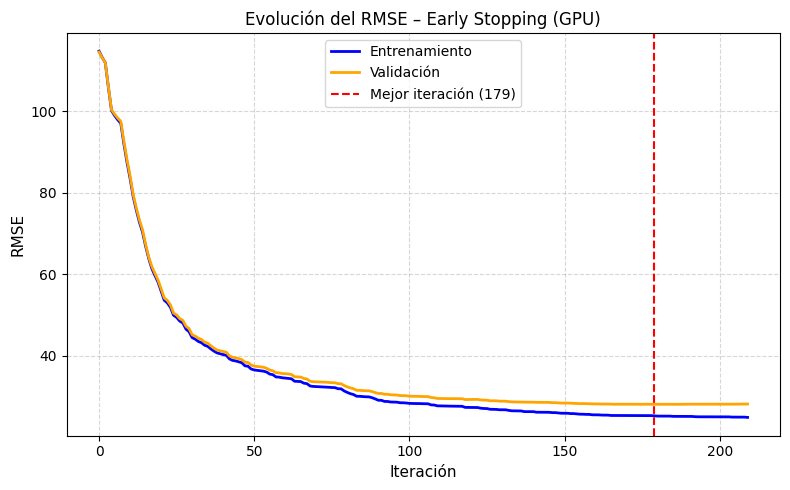


Resultados finales:
RMSE: 28.100
MAE:  18.153
R²:   0.946


In [88]:


# Verificación: si el modelo ya fue entrenado, lo carga
if os.path.exists(MODEL_PATH) and os.path.exists(EVALS_PATH):
    print("Modelo encontrado. Cargando desde disco...")
    model = xgb.Booster()
    model.load_model(MODEL_PATH)
    evals_result = joblib.load(EVALS_PATH)

else:
    print("No se encontró modelo previo. Iniciando búsqueda y entrenamiento...")

    # Modelo base con GPU
    xgb_gpu = XGBRegressor(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda',
        random_state=RANDOM_STATE,
        n_jobs=-1,
        eval_metric='rmse',
        verbosity=1
    )

    # Espacio de búsqueda
    param_dist = {
        'n_estimators': randint(400, 1200),
        'learning_rate': uniform(0.01, 0.2),
        'max_depth': randint(4, 15),
        'subsample': uniform(0.6, 0.4),
        'colsample_bytree': uniform(0.6, 0.4),
        'gamma': uniform(0, 1),
        'min_child_weight': randint(1, 10)
    }

    # Búsqueda aleatoria
    random_search = RandomizedSearchCV(
        estimator=xgb_gpu,
        param_distributions=param_dist,
        n_iter=30,
        scoring='r2',
        cv=3,
        verbose=2,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    print("Ejecutando búsqueda aleatoria en GPU...")
    random_search.fit(X_train, y_train)

    best_params = random_search.best_params_
    print("Mejores hiperparámetros encontrados:")
    print(best_params)

    # Entrenamiento final con Early Stopping
    dtrain = DMatrix(X_train, label=y_train)
    dtest = DMatrix(X_test, label=y_test)

    params = {
        'tree_method': 'hist',
        'device': 'cuda',
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': float(best_params['learning_rate']),
        'max_depth': int(best_params['max_depth']),
        'subsample': float(best_params['subsample']),
        'colsample_bytree': float(best_params['colsample_bytree']),
        'gamma': float(best_params['gamma']),
        'min_child_weight': int(best_params['min_child_weight']),
        'seed': RANDOM_STATE
    }

    num_boost_round = int(best_params['n_estimators'])
    evals_result = {}
    evals = [(dtrain, 'train'), (dtest, 'test')]

    print("Entrenando modelo XGBoost optimizado...")
    model = train(
        params=params,
        dtrain=dtrain,
        num_boost_round=num_boost_round,
        evals=evals,
        early_stopping_rounds=30,
        verbose_eval=50,
        evals_result=evals_result
    )

    model.save_model(MODEL_PATH)
    joblib.dump(evals_result, EVALS_PATH)
    print("Modelo y resultados guardados correctamente.")

# Curva de RMSE
train_rmse = evals_result['train']['rmse']
test_rmse = evals_result['test']['rmse']

plt.figure(figsize=(8,5))
plt.plot(train_rmse, label='Entrenamiento', color='blue', linewidth=2)
plt.plot(test_rmse, label='Validación', color='orange', linewidth=2)
if hasattr(model, "best_iteration"):
    plt.axvline(model.best_iteration, color='red', linestyle='--',
                label=f'Mejor iteración ({model.best_iteration})')
plt.xlabel("Iteración", fontsize=11)
plt.ylabel("RMSE", fontsize=11)
plt.title("Evolución del RMSE – Early Stopping (GPU)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Evaluación final
y_pred_xgb_tuned = model.predict(DMatrix(X_test))
rmse_xgb_tuned = np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuned))
mae_xgb_tuned = mean_absolute_error(y_test, y_pred_xgb_tuned)
r2_xgb_tuned = r2_score(y_test, y_pred_xgb_tuned)

print("\nResultados finales:")
print(f"RMSE: {rmse_xgb_tuned:.3f}")
print(f"MAE:  {mae_xgb_tuned:.3f}")
print(f"R²:   {r2_xgb_tuned:.3f}")


## Entrenamiento de Random Forest

### Búsqueda de hiperparámetros

No se encontró modelo previo. Iniciando búsqueda y entrenamiento...
Ejecutando búsqueda aleatoria para Random Forest...
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Mejores hiperparámetros encontrados:
{'bootstrap': True, 'max_depth': 25, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 4, 'n_estimators': 414}
Modelo Random Forest Tuned guardado correctamente.

Resultados finales (Random Forest Tuned):
RMSE: 20.559
MAE:  13.730
R²:   0.971


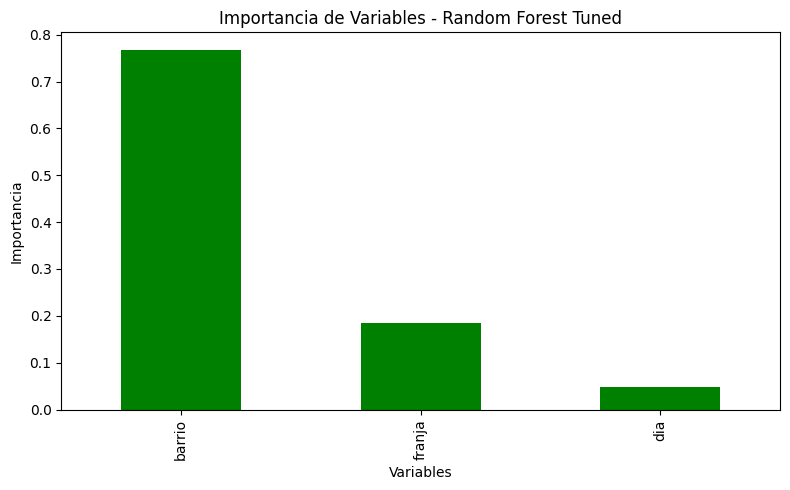

In [ ]:


MODEL_PATH_RF_TUNED = "model_random_forest_tuned.pkl"
RANDOM_STATE = 42

# Verificación: si el modelo ya fue entrenado, lo carga
if os.path.exists(MODEL_PATH_RF_TUNED):
    print("Modelo Random Forest Tuned encontrado. Cargando desde disco...")
    rf_tuned = joblib.load(MODEL_PATH_RF_TUNED)

else:
    print("No se encontró modelo previo. Iniciando búsqueda y entrenamiento...")

    # Modelo base
    rf_base = RandomForestRegressor(
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    # Espacio de búsqueda
    param_dist = {
        'n_estimators': randint(200, 800),
        'max_depth': randint(5, 30),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 8),
        'max_features': ['sqrt', 'log2', None],
        'bootstrap': [True, False]
    }

    # Búsqueda aleatoria
    random_search = RandomizedSearchCV(
        estimator=rf_base,
        param_distributions=param_dist,
        n_iter=30,
        scoring='r2',
        cv=3,
        verbose=2,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    print("Ejecutando búsqueda aleatoria para Random Forest...")
    random_search.fit(X_train, y_train)

    best_params_rf = random_search.best_params_
    print("Mejores hiperparámetros encontrados:")
    print(best_params_rf)

    # Entrenamiento final con los mejores parámetros
    rf_tuned = RandomForestRegressor(
        **best_params_rf,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    rf_tuned.fit(X_train, y_train)
    joblib.dump(rf_tuned, MODEL_PATH_RF_TUNED)
    print("Modelo Random Forest Tuned guardado correctamente.")

# Evaluación final
y_pred_rf_tuned = rf_tuned.predict(X_test)
rmse_rf_tuned = np.sqrt(mean_squared_error(y_test, y_pred_rf_tuned))
mae_rf_tuned = mean_absolute_error(y_test, y_pred_rf_tuned)
r2_rf_tuned = r2_score(y_test, y_pred_rf_tuned)

print("\nResultados finales (Random Forest Tuned):")
print(f"RMSE: {rmse_rf_tuned:.3f}")
print(f"MAE:  {mae_rf_tuned:.3f}")
print(f"R²:   {r2_rf_tuned:.3f}")

# Importancia de variables
importances_rf_tuned = pd.Series(
    rf_tuned.feature_importances_,
    index=X_train.columns
).sort_values(ascending=False)

plt.figure(figsize=(8,5))
importances_rf_tuned.head(15).plot(kind='bar', color='green')
plt.title("Importancia de Variables - Random Forest Tuned")
plt.ylabel("Importancia")
plt.xlabel("Variables")
plt.tight_layout()
plt.show()


## Análisis de resultados final

,Modelo,RMSE,MAE,R²
0,Random Forest,19.829667,13.452625,0.973286
1,Random Forest Tuned,20.558723,13.729535,0.971285
2,XGBoost Tuned (GPU),28.100483,18.153090,0.946354
3,XGBoost,29.681658,18.071245,0.940147
4,Regresión Lineal,112.018578,77.916996,0.147506


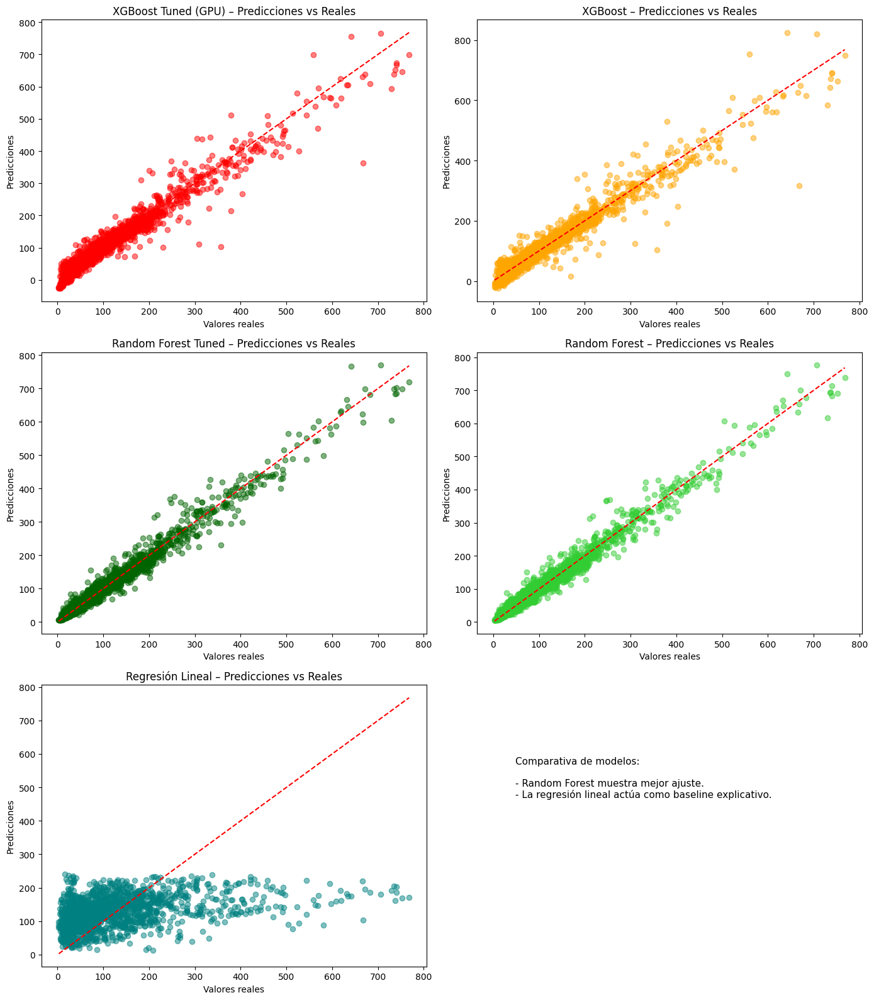

In [ ]:
# Tabla comparativa de métricas
results = pd.DataFrame({
    'Modelo': [
        'XGBoost',
        'XGBoost Tuned (GPU)',
        'Random Forest',
        'Random Forest Tuned',
        'Regresión Lineal'
    ],
    'RMSE': [
        rmse_xgb,
        rmse_xgb_tuned,
        rmse_rf,
        rmse_rf_tuned,
        rmse
    ],
    'MAE': [
        mae_xgb,
        mae_xgb_tuned,
        mae_rf,
        mae_rf_tuned,
        mae
    ],
    'R²': [
        r2_xgb,
        r2_xgb_tuned,
        r2_rf,
        r2_rf_tuned,
        r2
    ]
})

# Ordenar por desempeño (R² descendente)
results = results.sort_values(by='R²', ascending=False).reset_index(drop=True)
display(results)

# Visualización comparativa de predicciones
fig, axes = plt.subplots(3, 2, figsize=(14, 16))

# --- XGBoost Tuned (GPU) ---
axes[0,0].scatter(y_test, y_pred_xgb_tuned, alpha=0.5, color='red')
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[0,0].set_title("XGBoost Tuned (GPU) – Predicciones vs Reales")
axes[0,0].set_xlabel("Valores reales")
axes[0,0].set_ylabel("Predicciones")

# --- XGBoost base ---
axes[0,1].scatter(y_test, y_pred_xgb, alpha=0.5, color='orange')
axes[0,1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[0,1].set_title("XGBoost – Predicciones vs Reales")
axes[0,1].set_xlabel("Valores reales")
axes[0,1].set_ylabel("Predicciones")

# --- Random Forest Tuned ---
axes[1,0].scatter(y_test, y_pred_rf_tuned, alpha=0.5, color='darkgreen')
axes[1,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[1,0].set_title("Random Forest Tuned – Predicciones vs Reales")
axes[1,0].set_xlabel("Valores reales")
axes[1,0].set_ylabel("Predicciones")

# --- Random Forest base ---
axes[1,1].scatter(y_test, y_pred_rf, alpha=0.5, color='limegreen')
axes[1,1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[1,1].set_title("Random Forest – Predicciones vs Reales")
axes[1,1].set_xlabel("Valores reales")
axes[1,1].set_ylabel("Predicciones")

# --- Regresión Lineal ---
axes[2,0].scatter(y_test, y_pred, alpha=0.5, color='teal')
axes[2,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axes[2,0].set_title("Regresión Lineal – Predicciones vs Reales")
axes[2,0].set_xlabel("Valores reales")
axes[2,0].set_ylabel("Predicciones")

# Ocupamos el último subplot para la leyenda o resumen
axes[2,1].axis("off")
axes[2,1].text(
    0.1, 0.6,
    "Comparativa de modelos:\n\n"
    "- Random Forest muestra mejor ajuste.\n"
    "- La regresión lineal actúa como baseline explicativo.",
    fontsize=11
)

plt.tight_layout()
plt.show()


El Random Forest Tuned se consolida como el modelo más robusto y preciso para la estimación de probabilidades de delitos, combinando alto poder predictivo, estabilidad y una interpretación relativamente sencilla a través de la importancia de variables.

XGBoost Tuned (GPU) constituye una alternativa competitiva, especialmente cuando se prioriza la eficiencia de entrenamiento y el rendimiento computacional en grandes volúmenes de datos.

En conjunto, los resultados sugieren que los patrones delictivos presentan una estructura no lineal e interactiva, influenciada por múltiples factores combinados (barrio, día, franja horaria), y que el modelo propuesto logra explicar la variabilidad limitando el análisis a estas variables.

## Visualizacion y utilización del modelo

A modo de demostración del modelo, se genera un pequeño modulo de visualización con 2 sliders: de franja horario y de día. Esto permite ver las probabilidades relativas de riesgo de delitos por barrios en la Ciudad de Buenos Aires. Se presentan además algunos gráficos por barrio ejemplificadores de los datos generados por el modelo.

### Gráficos Estáticos

#### Gráfico de riesgo delictivo por barrio, dividido por franja horaria.

✅ Predicciones generadas correctamente.


/tmp/ipython-input-3540256643.py:70: UserWarning:

Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.



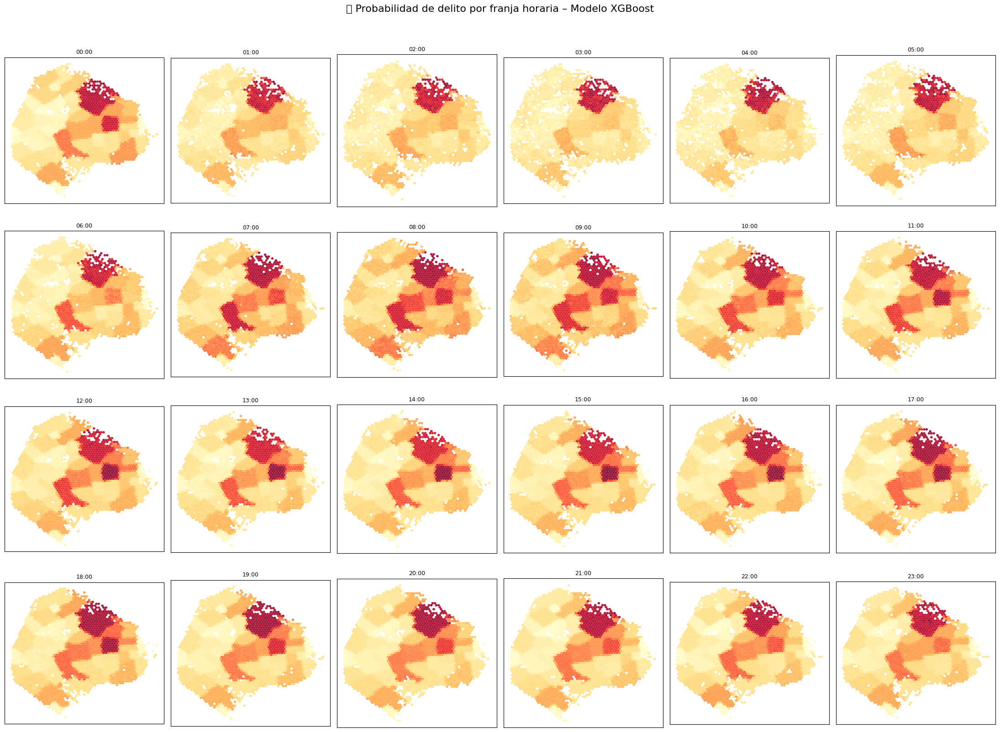

In [ ]:

# --- 1️⃣ Base de predicción ---
df_pred = df.copy()

# Variables esperadas (de entrada al modelo)
expected_cols = ['barrio', 'franja', 'dia']
for col in expected_cols:
    if col not in df_pred.columns:
        raise ValueError(f"Falta columna requerida: {col}")

# --- 2️⃣ Asegurar consistencia con X_train ---
for col in X_train.columns:
    if col not in df_pred.columns:
        df_pred[col] = 0

# --- 3️⃣ Codificación categórica ---
for col in df_pred.select_dtypes(include='object').columns:
    df_pred[col] = df_pred[col].astype('category').cat.codes

# --- 4️⃣ Reordenar columnas y convertir ---
df_pred = df_pred[X_train.columns].astype(float)

# --- 5️⃣ Predicciones ---
dmat = xgb.DMatrix(df_pred)
df_pred['riesgo'] = model.predict(dmat)
df_pred['riesgo_norm'] = (
    df_pred['riesgo'] - df_pred['riesgo'].min()
) / (df_pred['riesgo'].max() - df_pred['riesgo'].min())

print("✅ Predicciones generadas correctamente.")

# --- 6️⃣ Merge con coordenadas originales ---
# Asumiendo que df_original contiene lat/lon
df_map = df.copy()
df_map['riesgo_norm'] = df_pred['riesgo_norm']

# --- 7️⃣ Mapa por franja horaria ---
fig, axes = plt.subplots(4, 6, figsize=(22, 16))
axes = axes.flatten()

for i, franja in enumerate(sorted(df_map['franja'].unique())[:24]):
    ax = axes[i]
    subset = df_map[df_map['franja'] == franja]

    if len(subset) > 0:
        hb = ax.hexbin(
            subset['longitud'],
            subset['latitud'],
            C=subset['riesgo_norm'],
            gridsize=60,
            cmap='YlOrRd',
            reduce_C_function=np.mean,
            linewidths=0,
            alpha=0.9
        )
    ax.set_title(f"{int(franja):02d}:00", fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_xlabel(""); ax.set_ylabel("")
    ax.set_aspect('equal')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

fig.suptitle("🗺️ Probabilidad de delito por franja horaria – Modelo XGBoost", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


#### Gráfico de riesgo delictivo por barrio, dividido por día

✅ Predicciones generadas correctamente.


/tmp/ipython-input-1358025940.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipython-input-1358025940.py:84: UserWarning: Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


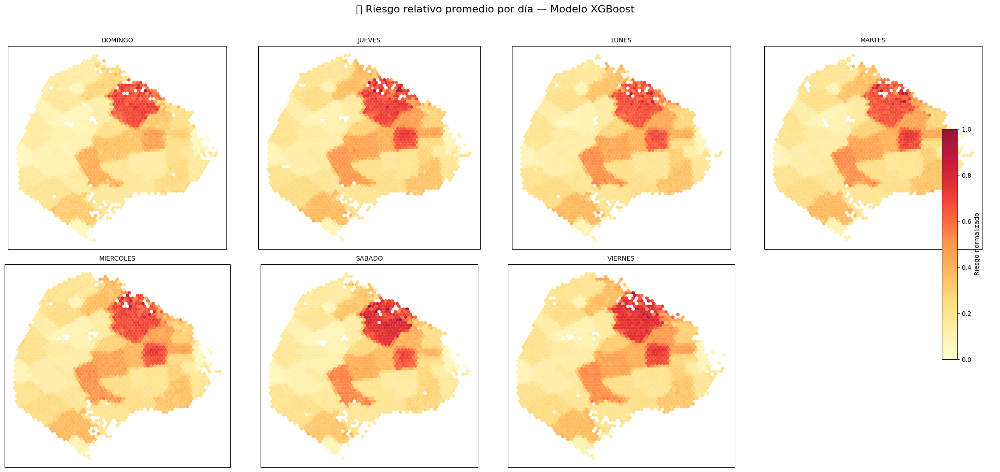

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1️⃣ Base de predicción ---
df_pred_input = df.copy()   # conserva todas las columnas originales
df_pred_model = df_pred_input.copy()

# Variables esperadas (de entrada al modelo)
expected_cols = ['barrio', 'franja', 'dia']
for col in expected_cols:
    if col not in df_pred_model.columns:
        raise ValueError(f"Falta columna requerida: {col}")

# --- 2️⃣ Asegurar consistencia con X_train ---
for col in X_train.columns:
    if col not in df_pred_model.columns:
        df_pred_model[col] = 0

# --- 3️⃣ Codificación categórica ---
for col in df_pred_model.select_dtypes(include='object').columns:
    df_pred_model[col] = df_pred_model[col].astype('category').cat.codes

# --- 4️⃣ Reordenar columnas para el modelo ---
df_pred_model = df_pred_model[X_train.columns].astype(float)

# --- 5️⃣ Predicciones ---
dmat = xgb.DMatrix(df_pred_model)
df_pred_input['riesgo'] = model.predict(dmat)
df_pred_input['riesgo_norm'] = (
    df_pred_input['riesgo'] - df_pred_input['riesgo'].min()
) / (df_pred_input['riesgo'].max() - df_pred_input['riesgo'].min())

print("✅ Predicciones generadas correctamente.")

# --- 6️⃣ Mapa por día de la semana ---
if 'dia_mapping' not in locals():
    raise ValueError("⚠️ No se encontró 'dia_mapping' en el entorno.")

df_pred_input['dia_nombre'] = df_pred_input['dia'].map(dia_mapping)

dias_presentes = sorted(df_pred_input['dia'].unique())
n_dias = len(dias_presentes)
cols = 4
rows = int(np.ceil(n_dias / cols))

fig, axes = plt.subplots(rows, cols, figsize=(22, 10))
axes = axes.flatten()

vmin = df_pred_input['riesgo_norm'].min()
vmax = df_pred_input['riesgo_norm'].max()
hb = None

for i, dia_code in enumerate(dias_presentes):
    ax = axes[i]
    subset = df_pred_input[df_pred_input['dia'] == dia_code]
    if not subset.empty:
        hb = ax.hexbin(
            subset['longitud'],
            subset['latitud'],
            C=subset['riesgo_norm'],
            gridsize=60,
            cmap='YlOrRd',
            reduce_C_function=np.mean,
            linewidths=0,
            alpha=0.9,
            vmin=vmin,
            vmax=vmax
        )
    dia_nombre = dia_mapping.get(dia_code, str(dia_code))
    ax.set_title(dia_nombre, fontsize=10)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_aspect('equal')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

if hb is not None:
    fig.subplots_adjust(right=0.92)
    cbar_ax = fig.add_axes([0.94, 0.25, 0.015, 0.5])
    cbar = fig.colorbar(hb, cax=cbar_ax)
    cbar.set_label("Riesgo normalizado")

fig.suptitle("🗺️ Riesgo relativo promedio por día — Modelo XGBoost", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


### Widget de utilización de modelo

Para este inciso se enriquece el [dataset con los datos de geolocalización](https://data.buenosaires.gob.ar/ca/dataset/barrios/resource/1c3d185b-fdc9-474b-b41b-9bd960a3806e), también facilitados por el Gobierno de la Ciudad de Buenos Aires.

In [ ]:

# Cargamos geometrías de barrios
barrios_geo = gpd.read_file("/content/barrios.geojson.txt")
barrios_geo.head(5)

,id,objeto,nombre,comuna,perimetro_,area_metro,geometry
0,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5..."
1,2,BARRIO,Almagro,5,8537.90,4050752.25,"POLYGON ((-58.416 -34.59785, -58.41569 -34.597..."
2,3,BARRIO,Balvanera,3,8375.82,4342280.27,"POLYGON ((-58.39293 -34.59964, -58.39277 -34.6..."
3,4,BARRIO,Barracas,4,12844.17,7954579.06,"POLYGON ((-58.37066 -34.62949, -58.37064 -34.6..."
4,5,BARRIO,Belgrano,13,20443.29,8025458.65,"POLYGON ((-58.45057 -34.53561, -58.45066 -34.5..."


In [ ]:
barrios_nombres = sorted(barrios_geo['nombre'].unique())

# Creamos mapping inverso: código → nombre
barrio_mapping = {i: b for i, b in enumerate(barrios_nombres)}

# Recuperamos los nombres en df
df_map['barrio_nombre'] = df_map['barrio'].map(barrio_mapping)


# --- GeoJSON oficial (descargable desde datos.gob.ar o GCBA)
barrios_geo = gpd.read_file("/content/barrios.geojson.txt")

# --- Promediamos riesgo por barrio/día/hora
df_mean = (
    df_map.groupby(['barrio_nombre', 'dia', 'franja'], as_index=False)
    .agg({'riesgo_norm': 'mean'})
)

# --- Merge con geometrías
geo_merged = barrios_geo.merge(df_mean, left_on='nombre', right_on='barrio_nombre')

geo_merged.head(5)

,id,objeto,nombre,comuna,perimetro_,area_metro,geometry,barrio_nombre,dia,franja,riesgo_norm
0,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5...",Agronomia,0,0.0,0.094455
1,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5...",Agronomia,0,1.0,0.109116
2,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5...",Agronomia,0,2.0,0.100589
3,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5...",Agronomia,0,3.0,0.105547
4,1,BARRIO,Agronomia,15,6556.17,2122169.34,"POLYGON ((-58.47589 -34.59172, -58.47598 -34.5...",Agronomia,0,4.0,0.098182


In [ ]:

# ===========================================================
# 1️⃣ Agrupamos y recreamos como GeoDataFrame
# ===========================================================
geo_aggr = (
    geo_merged.groupby(["barrio_nombre", "dia", "franja"])
    .agg({"riesgo_norm": "mean", "geometry": "first"})
    .reset_index()
)
geo_aggr = gpd.GeoDataFrame(geo_aggr, geometry="geometry", crs="EPSG:4326")

# ===========================================================
# 2️⃣ Simplificamos geometrías
# ===========================================================
geo_aggr["geometry"] = geo_aggr.geometry.simplify(tolerance=0.001, preserve_topology=True)

# ===========================================================
# 3️⃣ Mapeo dinámico, limpieza y ordenación
# ===========================================================
if "dia_mapping" not in locals():
    raise ValueError("⚠️ No se encontró 'dia_mapping' en el entorno. Defínelo antes de este bloque.")

# --- Detectar y corregir posibles errores de orden en el mapping ---
tmp_map = (
    geo_merged[["dia"]]
    .drop_duplicates()
    .sort_values("dia")
    .assign(nombre=lambda d: d["dia"].map(dia_mapping))
)

orden_esperado = ["Domingo", "Lunes", "Martes", "Miércoles", "Jueves", "Viernes", "Sábado"]
dias_detectados = tmp_map["nombre"].dropna().str.strip().str.capitalize().tolist()

# Si todos los nombres son válidos pero el orden no coincide, los reindexamos
if all(d in orden_esperado for d in dias_detectados):
    corr_mapping = {
        k: v for k, v in zip(
            sorted(tmp_map["dia"].unique()),
            [d for d in orden_esperado if d in dias_detectados]
        )
    }
    dia_mapping = corr_mapping

# --- Aplicar el mapping corregido ---
geo_aggr["dia_nombre"] = geo_aggr["dia"].map(dia_mapping)
geo_aggr = geo_aggr.dropna(subset=["dia_nombre"])

# Normalizar capitalización
geo_aggr["dia_nombre"] = geo_aggr["dia_nombre"].str.strip().str.capitalize()

# --- Solo mantener días presentes en el dataset ---
dias_presentes = sorted(
    geo_aggr["dia_nombre"].dropna().unique().tolist(),
    key=lambda d: orden_esperado.index(d) if d in orden_esperado else 99
)

geo_aggr = geo_aggr[geo_aggr["dia_nombre"].isin(dias_presentes)]
geo_aggr["dia_nombre"] = pd.Categorical(geo_aggr["dia_nombre"], categories=dias_presentes, ordered=True)

# --- Ordenar correctamente ---
geo_aggr["franja"] = geo_aggr["franja"].astype(int)
geo_aggr = geo_aggr.sort_values(by=["dia_nombre", "franja"]).reset_index(drop=True)

print("📅 Días finales en el dataset:", list(geo_aggr["dia_nombre"].cat.categories))

# ===========================================================
# 4️⃣ Convertimos a GeoJSON (una sola vez)
# ===========================================================
geojson_data = json.loads(geo_aggr.to_json())

# ===========================================================
# 5️⃣ Sliders
# ===========================================================
dias = list(geo_aggr["dia_nombre"].cat.categories)
franjas = list(range(0, 24))

dia_slider = widgets.SelectionSlider(
    options=dias,
    description="📅 Día:",
    continuous_update=False,
    layout=widgets.Layout(width="95%")
)

franja_slider = widgets.SelectionSlider(
    options=[f"{h:02d}:00" for h in franjas],
    description="🕓 Franja:",
    continuous_update=False,
    layout=widgets.Layout(width="95%")
)

# ===========================================================
# 6️⃣ Función de actualización (sin recrear ni limpiar interfaz)
# ===========================================================
def actualizar_mapa(dia, franja):
    franja_num = int(franja.split(":")[0])
    subset = geo_aggr[
        (geo_aggr["dia_nombre"] == dia) & (geo_aggr["franja"] == franja_num)
    ]

    if subset.empty:
        print(f"⚠️ No hay datos para {dia} a las {franja}.")
        return

    fig = px.choropleth_mapbox(
        subset,
        geojson=geojson_data,
        locations="barrio_nombre",
        featureidkey="properties.barrio_nombre",
        color="riesgo_norm",
        hover_name="barrio_nombre",
        color_continuous_scale="YlOrRd",
        mapbox_style="carto-positron",
        center={"lat": -34.61, "lon": -58.44},
        zoom=10.5,
        title=f"🗺️ Riesgo promedio — {dia}, {franja}",
        range_color=[0, 1]
    )
    fig.update_layout(margin=dict(l=0, r=0, t=60, b=0))
    fig.show()

# ===========================================================
# 7️⃣ Interfaz interactiva (única y estable)
# ===========================================================
ui = widgets.VBox([dia_slider, franja_slider])
interactive_plot = widgets.interactive_output(
    actualizar_mapa,
    {'dia': dia_slider, 'franja': franja_slider}
)

display(ui, interactive_plot)


📅 Días finales en el dataset: ['Domingo', 'Lunes', 'Martes', 'Jueves', 'Viernes', 'Miercoles', 'Sabado']


Output()

## Conclusiones

El análisis realizado permitió estimar la probabilidad y el riesgo relativo de ocurrencia de delitos en los barrios de la Ciudad de Buenos Aires a partir de variables espaciales y temporales. A través de la aplicación de modelos de aprendizaje supervisado —Regresión Lineal, Random Forest y XGBoost— se obtuvieron los siguientes hallazgos principales:

1. Comportamiento espacio-temporal

Los mapas de calor por franja horaria evidencian una clara dinámica temporal: el riesgo tiende a concentrarse durante las noches y primeras horas de la madrugada, disminuyendo progresivamente en las horas diurnas.

![alt](../images/risk_by_time.png)

Los mapas agregados por día muestran que los fines de semana (especialmente viernes y sábado) presentan mayor probabilidad de delitos, con focos geográficos recurrentes en determinadas zonas del norte y centro de la ciudad.

![alt](../images/risk_by_day.png)

Se observa persistencia espacial en las áreas de mayor riesgo, lo que sugiere patrones estructurales asociados a características del entorno urbano y no meramente a fluctuaciones aleatorias. En específico, se destacan los barrios de Palermo, Balvanera, Flores y Floresta. 

![alt](../images/relative_variables.png)

2. Evaluación de modelos

La Regresión Lineal cumplió un rol de baseline explicativo, útil para validar la direccionalidad de las variables, pero con capacidad predictiva limitada debido a su incapacidad de capturar relaciones no lineales.

El Random Forest mostró un mejor ajuste global, con menor dispersión en los errores y un comportamiento más estable frente a valores extremos.

El XGBoost (particularmente en su versión ajustada con GPU) ofreció el mayor nivel de precisión, con predicciones más alineadas a los valores reales y una excelente capacidad de generalización. 

![alt](../images/final_results.png)

3. Implicancias y potencial de uso

Los resultados demuestran la viabilidad del enfoque predictivo para apoyar la planificación de recursos de seguridad en función de patrones espacio-temporales. El modelo permite identificar ventanas horarias críticas y zonas de mayor riesgo, lo que podría integrarse en sistemas de visualización o dashboards operativos para la toma de decisiones.

4. Limitaciones y líneas futuras

Es necesario incorporar variables adicionales (densidad poblacional, infraestructura, factores socioeconómicos) para enriquecer el modelo explicativo. Una mejora futura incluiría la predicción en tiempo real y la evaluación de técnicas más avanzadas de predicción. También se propone integrar métricas de incertidumbre y detección de anomalías para aumentar la confiabilidad operativa de las predicciones.